# FloodSENS-OAI

## GoF

## 1. Executive summary
*Estimates publihed in a recent policy research working paper by University College London (UCL) show that globally 2.2 billion people are exposed to some level of flood risk; 1.47 billion people, or 19 percent of the world population, are exposed to a significant level of flood risk (i.e. facing inundation depths of over 0.15 meter in the event of a 1-in-100 year flood. This is an enormous risk exposure and adding to that fatal rare events such as the dam failures in Libya following heavy rainfall this month causing more than 10,000 deaths, makes floods one of the costliest disasters. It is therefore crucial to deliver better, more timely and easy-to-interpret infornation content to rescue teams, relef and response organizations as well as develop viable map and trusted expert map products targeted at the humanitarian, emergency response and re-insurance sectors. Satellite-based flood mapping presents numerous advantages over traditional ground-based networks to map flooding across large spatial scales in a timely and cost-effective manner. Traditionally, synthetic aperture radar (SAR) data is preferred since this technology sees through clouds and is independent of daylight. At RSS-Hydro, we developed FloodSENS, our flagship EO product, supported by ESA. It can utilize U-Net and SE-Net techniques on optical imagery to generate flood maps, and uses topography and static water flow grids to enable flood mapping globally on far wider temporal and spatial scales. In this OrbitalAI challenge, we developed FloodSENS-OIA (“Orbital AI”), which is based on a much lighter ML model that uses a version of the Random Forest (RF) algorithm to allow much fewer input channels without compromising mapping accuracy when compared against traditional benchmark band ratio algorithms.*


## 2. Imports and code dependencies
*Provide a list of Python dependencies and custom code required to reproduce the results*


In [ ]:
import os
import rasterio
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
import joblib


### Création du modèle

# Définir le chemin vers le dossier contenant les images Sentinel-2 (les bandes) et le raster d'étiquettes
data_folder = '/content/drive/MyDrive/labels'

# Charger le raster d'étiquettes (eau)
with rasterio.open(os.path.join(data_folder, 'Labels_pakistan_RVR.tif')) as src_labels:
    # Lire le raster d'étiquettes en entier
    labels_data = src_labels.read(1)

# Initialiser un dictionnaire pour stocker les modèles pour chaque bande
models = {}

# Définir une marge pour la réduction de taille (pour réduire l'entrainement)
margin = 150

# Boucle sur chaque bande Sentinel-2
for band_filename in os.listdir(data_folder):
    if band_filename.endswith('.jp2'):
        with rasterio.open(os.path.join(data_folder, band_filename)) as src_band:
            # Lire la bande en entier
            band_data = src_band.read(1)

            # Découper la bande pour conserver uniquement la partie centrale (enlever la marge)
            band_data_cropped = band_data[margin:-margin, margin:-margin]

            # Mise à jour de la transformation et de la taille du raster d'étiquettes
            transform = src_band.transform
            transform_cropped = rasterio.transform.Affine(
                transform.a, transform.b, transform.c - margin * transform.a,
                transform.d, transform.e, transform.f - margin * transform.e
            )
            labels_data_cropped = labels_data[margin:-margin, margin:-margin]

            # Créez un modèle Random Forest pour chaque bande
            rf_classifier = RandomForestClassifier(random_state=5)

            # Sélectionner uniquement les pixels d'eau (étiquette = 1) pour l'entraînement
            water_pixels = labels_data_cropped == 1
            X_water = band_data_cropped[water_pixels].reshape(-1, 1)
            Y_water = np.ones(X_water.shape[0])  # Étiquettes pour l'eau sont toutes 1

            # Sélectionner les autres pixels (étiquette = 0) pour l'entraînement
            non_water_pixels = labels_data_cropped == 0
            X_non_water = band_data_cropped[non_water_pixels].reshape(-1, 1)
            Y_non_water = np.zeros(X_non_water.shape[0])  # Étiquettes pour tout le reste sont toutes 0

            # Combinez les données d'eau et de non-eau
            X = np.vstack((X_water, X_non_water))
            Y = np.concatenate((Y_water, Y_non_water))

            # Diviser les données en ensembles d'entraînement et de test
            X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=5)

            # Entraîner le modèle sur l'ensemble d'entraînement
            rf_classifier.fit(X_train, y_train)

            # Stockez le modèle dans le dictionnaire
            models[band_filename] = {
                'model': rf_classifier,
                'transform': transform_cropped
            }

            # Indiquer quand une bande a été traitée
            print(f"Bande {band_filename} traitée.")

# Enregistrez tous les modèles dans un fichier
joblib.dump(models, 'FloodSENS-OAI.pkl')



### Utilisation de l'image HSI

# Définir le chemin vers le fichier TIFF HSI
hsi_tif_path = 'C:/Users/eguil/Downloads/Psouth_test.tif'

# Ouvrir le fichier TIFF HSI avec rasterio
with rasterio.open(hsi_tif_path) as src_hsi:
    # Lire les métadonnées de l'image HSI
    metadata = src_hsi.meta
    
    # Obtenir le nombre de bandes hyperspectrales
    num_bands_hsi = src_hsi.count
    
    # Initialiser une liste pour stocker les bandes hyperspectrales
    hyperspectral_bands = []
    
    # Boucler à travers chaque bande hyperspectrale
    for band_idx in range(1, num_bands_hsi + 1):
        # Lire la bande hyperspectrale
        band_data = src_hsi.read(band_idx)
        
        # Ajouter la bande à la liste des bandes hyperspectrales
        hyperspectral_bands.append(band_data)

# Charger les modèles Random Forest déjà entraînés
loaded_models = joblib.load('FloodSENS-OAI.pkl.pkl')

# Initialiser une liste pour stocker les prédictions de chaque modèle
predictions = []

# Boucler à travers chaque bande hyperspectrale
for band_data in hyperspectral_bands:
    # Remodeler la bande en un tableau 1D pour l'inférence
    band_data = band_data.ravel()
    
    # Initialiser une liste pour stocker les prédictions de chaque modèle pour cette bande
    band_predictions = []
    
    # Boucler à travers chaque modèle Sentinel-2
    for band_filename, model_info in loaded_models.items():
        # Charger le modèle et sa transformation
        rf_classifier = model_info['model']
        transform = model_info['transform']
        
        # Appliquer la transformation à la bande hyperspectrale
        transformed_band = rasterio.warp.transform(src_hsi.transform, band_data, src_hsi.transform, out_shape=rf_classifier.estimators_[0].n_features_)
        
        # Prédire l'eau sur cette bande avec le modèle
        prediction = rf_classifier.predict(transformed_band.reshape(-1, 1))
        
        # Ajouter la prédiction à la liste des prédictions de cette bande
        band_predictions.append(prediction)
    
    # Fusionner les prédictions des modèles pour cette bande (par exemple, utiliser la majorité)
    band_predictions = np.array(band_predictions)
    fused_prediction = np.mean(band_predictions, axis=0) > 0.5  # Fusionner en utilisant la moyenne
    
    # Ajouter la prédiction fusionnée à la liste des prédictions finales
    predictions.append(fused_prediction)

# Pourcentage maximal de bandes sur lesquelles un pixel doit apparaître en 1 pour être classé comme 1
max_percentage_for_1 = 0.4  # 40%

# Nombre de bandes totales
num_bands = len(predictions)

# Initialiser un tableau pour la classification finale
final_classification = np.zeros(predictions[0].shape, dtype=np.uint8)

# Boucle sur chaque pixel
for i in range(final_classification.shape[0]):
    for j in range(final_classification.shape[1]):
        count_1 = 0
        for prediction_band in predictions:
            if prediction_band[i, j] == 1:
                count_1 += 1
        if count_1 / num_bands <= max_percentage_for_1:
            final_classification[i, j] = 1

# Sauvegarder la classification finale en tant qu'image TIFF
output_tif_path = 'C:/Users/eguil/Downloads/classification_HSI.tif'
with rasterio.open(
    output_tif_path,
    'w',
    driver='GTiff',
    width=final_classification.shape[1],
    height=final_classification.shape[0],
    count=1,
    dtype=np.uint8,
    crs=src_hsi.crs,
    transform=src_hsi.transform,
) as dst:
    dst.write(final_classification, 1)

print(f"Classification finale enregistrée sous : {output_tif_path}")



## 3. Input/Output data and example training labels (if applicable)

- Example of an input for the code : Image of Sentinel 2 
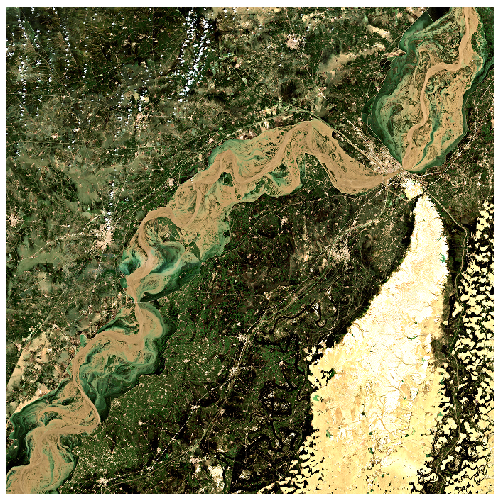
- This an example of our label
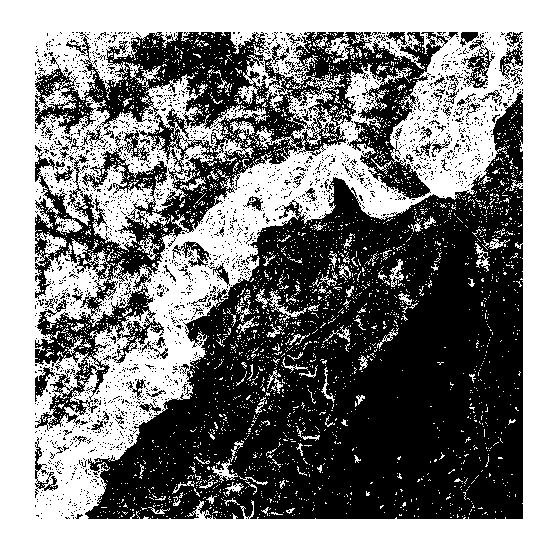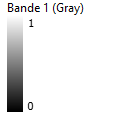
- The model expects some jp2 image, but can be quickly adapting, for tif or other format.

- You can use image that are the same size of Sentinel 2. ( 10980x10980 pixels)

- The bit depth of the input image is 16 bits for Sentinel 2 and our labels are in Float 32.

- In the input you can adapt to 1 to 13 bands for the training.

- The output will be in unint8 or can be changed and adapted.

- The data will convert the data in the range (-1 , 1)

- The normalization used is the min-max scaling method.

- The output will be a tif file.

- The range of the output data will be 0 and 1 with 1 for flood pixel and 0 no flood.

## 4. Description of ML algorithm and training strategies

The RF ML version of FloodSENS is specifically developed for ease of implementation, efficient 
resource consumption and above all proven scientific robustness across a variety of EO sensors 
and mapping applications

•FloodSENS-OAI adaption to HSI – integration of more channels in the future 

•Minimum computational resources required

Our choice of model was based on NASA’s working principle: 
If it ain't broke, don't fix it!
RF is known to be simple yet robust, consistently yielding scientifically correct results 
Training strategy: our flood team expertly labels Sentinel-2 flood images from events all around 
the world, covering a large number of diverse geographies, climate and flood event types.

The RF model uses these labels along with the Sentinel-2 images to learn the correlations and 
patterns. The RF trained model is then applied to the resampled HSI flood image to infer a flood
map at 20 m resolution.


## 5. Inference step

- For model code, please refer to section 2. The diagram below shows the architecture of the RF inference model that is used by FloodSENS-OAI

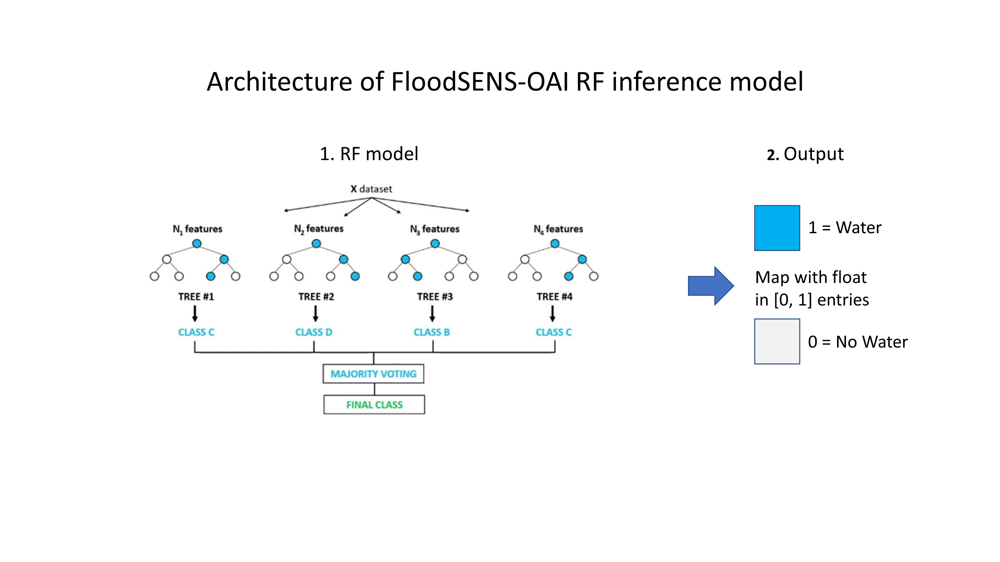


## 6.    Validation
        
- A popular and established flood detection method is the Normalized Difference Water Index (NDWI) which can be computed directly from the Sentinel-2 bands. We used this as a benchmark flood map to validated the FloodSENS-OAI inferred flooding. The overlay operation results can be seen in the figure below. The achieved accuracy to the NDWI benchmark is 96.6%. This is a very respectable performance.

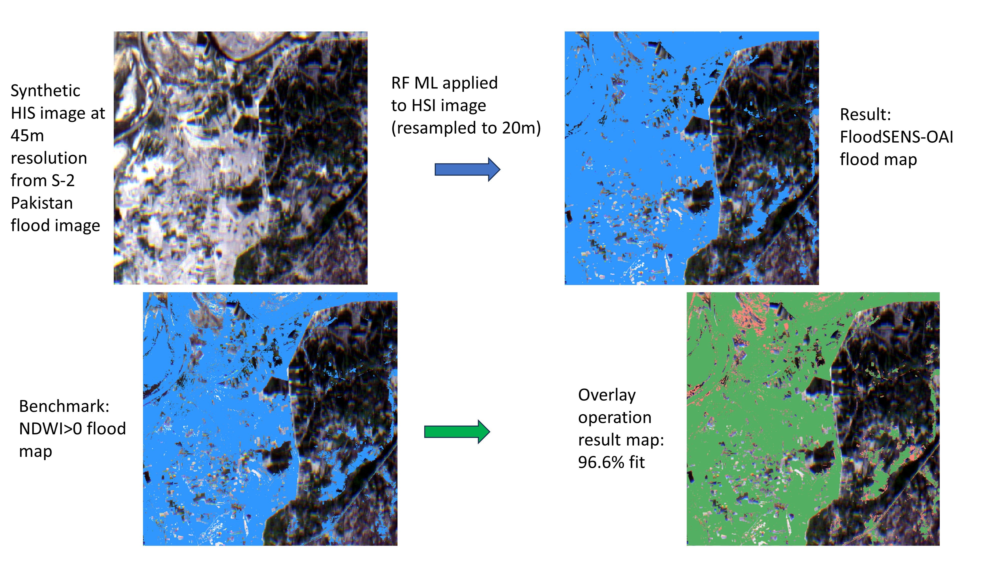


However, the robustness and transferability of FloodSENS-OAI RF model needs to be further 
trained and tested in Phase 2 of this challenge..